In [1]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("manjilkarki/deepfake-and-real-images")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'deepfake-and-real-images' dataset.
Path to dataset files: /kaggle/input/deepfake-and-real-images


In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import os
import json
from PIL import Image

In [3]:
data_path = "/kaggle/input/deepfake-and-real-images"
print(os.listdir(data_path))

['Dataset']


In [4]:
data_path = "/kaggle/input/deepfake-and-real-images"
print(os.listdir(data_path))

['Dataset']


In [5]:
inner_path = os.path.join(data_path, "Dataset")
print(os.listdir(inner_path))

['Validation', 'Test', 'Train']


In [6]:
base_dir ='/kaggle/input/deepfake-and-real-images/Dataset/Train'
image_path='/kaggle/input/deepfake-and-real-images/Dataset/Train/Fake/fake_1001.jpg'

In [7]:
import matplotlib.image as mpimg

In [8]:
img = mpimg.imread(image_path)
print(img.shape)

(256, 256, 3)


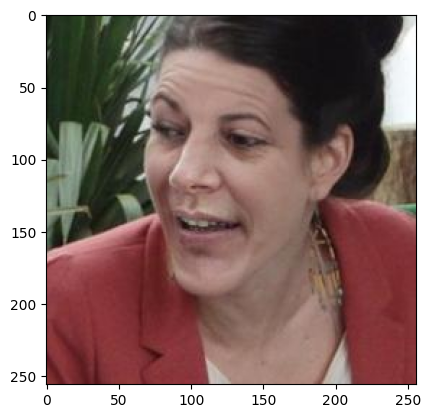

In [9]:
plt.imshow(img)
plt.axis()
plt.show()

In [10]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Define data directory (assuming your data is structured with subfolders for classes, e.g., Train/Real, Train/Fake)
data_dir = '/kaggle/input/deepfake-and-real-images/Dataset/Train'

# Define transformations for the images
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to a common size
    transforms.ToTensor(),         # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # Normalize pixel values
])

# Create an ImageFolder dataset
train_dataset = datasets.ImageFolder(data_dir, transform=transform)




In [24]:
import random
from torch.utils.data import DataLoader, Subset, random_split
indices = random.sample(range(len(train_dataset)), 10000)
print(indices)
small_dataset = Subset(train_dataset, indices)

[138482, 16600, 100323, 108855, 9148, 61862, 37358, 63018, 7406, 92207, 66709, 38887, 105370, 65083, 74930, 11424, 130009, 17504, 97456, 56554, 115853, 83531, 1233, 83514, 113041, 11152, 102730, 20066, 68231, 62561, 19028, 48897, 63929, 47661, 131049, 6269, 4411, 134012, 122439, 130750, 13440, 25119, 117394, 129749, 50795, 28654, 61810, 104768, 56282, 112979, 80099, 124051, 79378, 48183, 88589, 51710, 108458, 99055, 113509, 89585, 130994, 131566, 133879, 21058, 106253, 123480, 119261, 94686, 22007, 95409, 82400, 92532, 7273, 29483, 24137, 5761, 63770, 94528, 63130, 47864, 101569, 86378, 31301, 14574, 99552, 23687, 55263, 45003, 37671, 14322, 138445, 61969, 24041, 23131, 138206, 127100, 135967, 26008, 110912, 57824, 13306, 87957, 74641, 111563, 102549, 32474, 90647, 68041, 118006, 10910, 31307, 52073, 11165, 22778, 76891, 25541, 61042, 114437, 94207, 53032, 32252, 3233, 107228, 35345, 21559, 49673, 75977, 123868, 32347, 194, 53419, 114405, 12510, 25176, 117924, 72680, 116645, 49560, 554

In [25]:
# Create a DataLoader
batch_size = 32
train_loader = DataLoader(small_dataset, batch_size=batch_size, shuffle=True)

print(f"Successfully loaded {len(small_dataset)} images into the dataset.")
print(f"Number of batches in DataLoader: {len(train_loader)}")
print(f"Classes found: {train_dataset.classes}")

Successfully loaded 10000 images into the dataset.
Number of batches in DataLoader: 313
Classes found: ['Fake', 'Real']


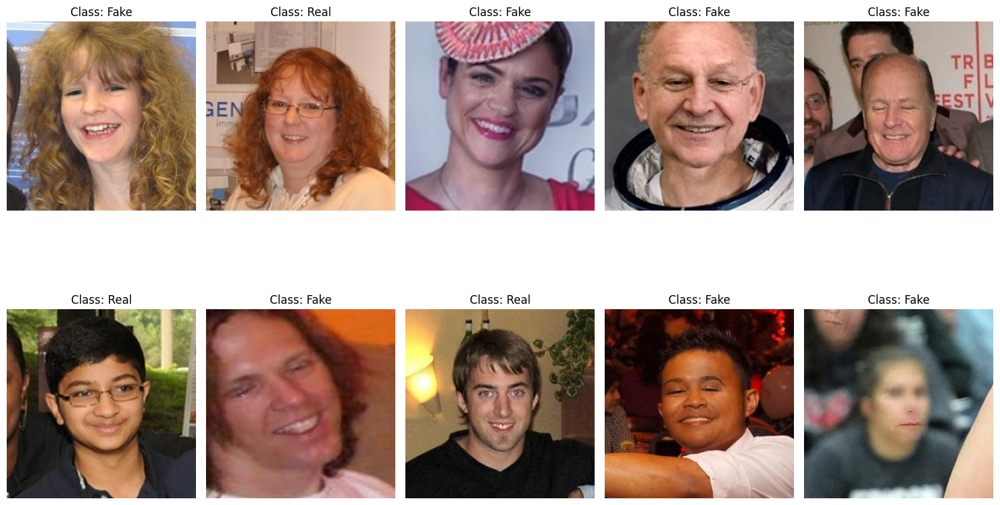

In [26]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Get class names
class_names = train_dataset.classes

# Denormalization function (inverse of the normalization applied during transform)
# Mean and Std used in normalization: mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
def denormalize(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    # Transpose from C, H, W to H, W, C
    img_array = tensor.numpy().transpose((1, 2, 0))
    img_array = std * img_array + mean
    img_array = np.clip(img_array, 0, 1) # Clip to [0, 1] range
    return img_array

plt.figure(figsize=(15, 10))
for i in range(10):
    # Get a random index
    idx = random.randint(0, len(small_dataset) - 1)
    image, label = small_dataset[idx]

    # Denormalize and convert to NumPy array for plotting
    img_to_show = denormalize(image)

    plt.subplot(2, 5, i + 1)
    plt.imshow(img_to_show)
    plt.title(f"Class: {class_names[label]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [27]:
val_dir = '/kaggle/input/deepfake-and-real-images/Dataset/Validation'

# Define transformations for the images
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to a common size
    transforms.ToTensor(),         # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # Normalize pixel values
])

# Create an ImageFolder dataset
val_dataset = datasets.ImageFolder(val_dir, transform=transform)

In [28]:
indicesval = random.sample(range(len(val_dataset)), 2000)
valsmall_dataset = Subset(val_dataset, indicesval)

In [29]:
# Create a DataLoader for the validation set
batch_size = 32 # Using the same batch size as the training loader
val_loader = DataLoader(valsmall_dataset, batch_size=batch_size, shuffle=False)

print(f"Successfully loaded {len(valsmall_dataset)} validation images into the dataset.")
print(f"Number of batches in validation DataLoader: {len(val_loader)}")
print(f"Classes found in validation set: {val_dataset.classes}")

Successfully loaded 2000 validation images into the dataset.
Number of batches in validation DataLoader: 63
Classes found in validation set: ['Fake', 'Real']


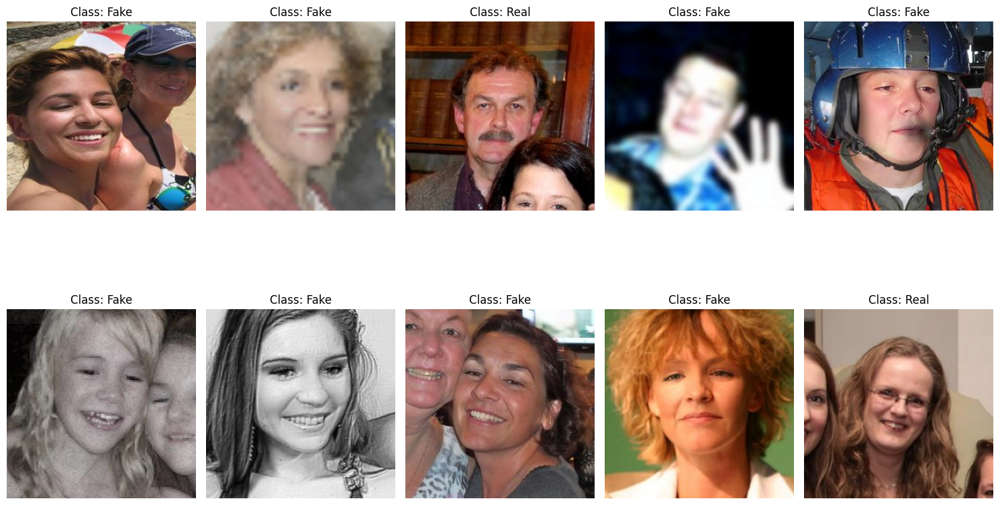

In [30]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Get class names from the validation dataset
class_names = val_dataset.classes

# Denormalization function (inverse of the normalization applied during transform)
def denormalize(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    # Transpose from C, H, W to H, W, C
    img_array = tensor.numpy().transpose((1, 2, 0))
    img_array = std * img_array + mean
    img_array = np.clip(img_array, 0, 1) # Clip to [0, 1] range
    return img_array

plt.figure(figsize=(15, 10))
for i in range(10):
    # Get a random index from the validation dataset
    idx = random.randint(0, len(valsmall_dataset) - 1)
    image, label = valsmall_dataset[idx]

    # Denormalize and convert to NumPy array for plotting
    img_to_show = denormalize(image)

    plt.subplot(2, 5, i + 1)
    plt.imshow(img_to_show)
    plt.title(f"Class: {class_names[label]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [31]:
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm # Для красивого отображения прогресса
import matplotlib.pyplot as plt # Для графиков

class ImageClassifierTrainer:
    def __init__(self,
                 model: nn.Module,
                 train_loader: torch.utils.data.DataLoader,
                 val_loader: torch.utils.data.DataLoader,
                 learning_rate: float = 0.001,
                 num_classes: int = 2,
                 device: str = 'cuda' if torch.cuda.is_available() else 'cpu'):

        self.device = torch.device(device)
        self.model = model.to(self.device)
        self.train_loader = train_loader
        self.val_loader = val_loader

        self.criterion = nn.CrossEntropyLoss()
        self.optimizer = optim.Adam(self.model.parameters(), lr=learning_rate)

        # Списки для хранения метрик
        self.train_losses = []
        self.train_accuracies = []
        self.val_losses = []
        self.val_accuracies = []

        print(f"Trainer initialized. Using device: {self.device}")
        print(f"Model architecture:\n{self.model}")

    def _train_epoch(self):
        self.model.train() # Устанавливаем модель в режим обучения
        running_loss = 0.0
        correct_predictions = 0
        total_samples = 0

        for inputs, labels in tqdm(self.train_loader, desc="Training Epoch"):
            inputs, labels = inputs.to(self.device), labels.to(self.device)

            self.optimizer.zero_grad()

            outputs = self.model(inputs)
            loss = self.criterion(outputs, labels)

            loss.backward()
            self.optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            _, predicted = torch.max(outputs.data, 1)
            total_samples += labels.size(0)
            correct_predictions += (predicted == labels).sum().item()

        epoch_loss = running_loss / total_samples
        epoch_accuracy = correct_predictions / total_samples
        return epoch_loss, epoch_accuracy

    def _validate_epoch(self):
        self.model.eval() # Устанавливаем модель в режим оценки
        running_loss = 0.0
        correct_predictions = 0
        total_samples = 0

        with torch.no_grad(): # Отключаем расчет градиентов для валидации
            for inputs, labels in tqdm(self.val_loader, desc="Validation Epoch"):
                inputs, labels = inputs.to(self.device), labels.to(self.device)

                outputs = self.model(inputs)
                loss = self.criterion(outputs, labels)

                running_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total_samples += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

        epoch_loss = running_loss / total_samples
        epoch_accuracy = correct_predictions / total_samples
        return epoch_loss, epoch_accuracy

    def train(self, num_epochs: int):
        print("\nStarting training...")
        for epoch in range(num_epochs):
            train_loss, train_acc = self._train_epoch()
            val_loss, val_acc = self._validate_epoch()

            self.train_losses.append(train_loss)
            self.train_accuracies.append(train_acc)
            self.val_losses.append(val_loss)
            self.val_accuracies.append(val_acc)

            print(f'Epoch {epoch+1}/{num_epochs} - '
                  f'Train Loss: {train_loss:.4f}, Train Acc: {train_acc:.4f} - '
                  f'Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}')
            self.plot_metrics()

        print("Training complete!")

    def plot_metrics(self):
        epochs = range(1, len(self.train_losses) + 1)

        plt.figure(figsize=(12, 5))

        # Plotting Loss
        plt.subplot(1, 2, 1)
        plt.plot(epochs, self.train_losses, 'b', label='Training loss')
        plt.plot(epochs, self.val_losses, 'r', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.grid(True)

        # Plotting Accuracy
        plt.subplot(1, 2, 2)
        plt.plot(epochs, self.train_accuracies, 'b', label='Training accuracy')
        plt.plot(epochs, self.val_accuracies, 'r', label='Validation accuracy')
        plt.title('Training and Validation Accuracy')
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.legend()
        plt.grid(True)

        plt.tight_layout()
        plt.show()

    def save_model(self, path: str = 'model.pth'):
        torch.save(self.model.state_dict(), path)
        print(f"Model saved to {path}")

In [32]:
# Пример использования (позже вы замените MyCustomModel на свою модель):
class MyCustomModel(nn.Module):
    def __init__(self, num_classes=2):
        super(MyCustomModel, self).__init__()
        # Здесь будет ваша архитектура модели
        self.features = nn.Sequential(
            # Блок 1
            nn.Conv2d(3, 8, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            # Блок 2
            nn.Conv2d(8, 16, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            # Блок 3
            nn.Conv2d(16, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),

            # Блок 4
            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2),
        )
        self.classifier = nn.Sequential(
            # Полносвязные слои
            nn.Linear(16 * 16 * 64, 100),  # 16*16*64 = 16384
            nn.ReLU(),
            nn.Dropout(0.25),
            nn.Linear(100, 2), # Размерность должна быть адаптирована
        )

    def forward(self, x):
        x = self.features(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x



In [33]:
# # Инициализируйте вашу модель
my_model = MyCustomModel(num_classes=len(train_dataset.classes))

# # Инициализируйте трейнер
# trainer = ImageClassifierTrainer(
#     model=my_model,
#     train_loader=train_loader,
#     val_loader=val_loader,
#     learning_rate=0.001,
#     num_classes=len(train_dataset.classes)
# )

# # Запустите обучение
# trainer.train(num_epochs=10)

# # Сохраните модель
# trainer.save_model('my_trained_model.pth')


In [34]:
# Инициализируйте трейнер
trainer = ImageClassifierTrainer(
    model=my_model,
    train_loader=train_loader,
    val_loader=val_loader,
    learning_rate=0.0003,
    num_classes=len(train_dataset.classes)
)

Trainer initialized. Using device: cpu
Model architecture:
MyCustomModel(
  (features): Sequential(
    (0): Conv2d(3, 8, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(8, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU()
    (8): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (9): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (10): ReLU()
    (11): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (classifier): Sequential(
    (0): Linear(in_features=16384, out_features=100, bias=True)
    (1): ReLU()
    (2): Dropout(p=0.25, inplace=False)
    (3): Linear(in_features=100, out_features=2, 


Starting training...


Validation Epoch: 100%|██████████| 63/63 [00:41<00:00,  1.52it/s]


Epoch 1/7 - Train Loss: 0.5689, Train Acc: 0.6981 - Val Loss: 0.5219, Val Acc: 0.7310


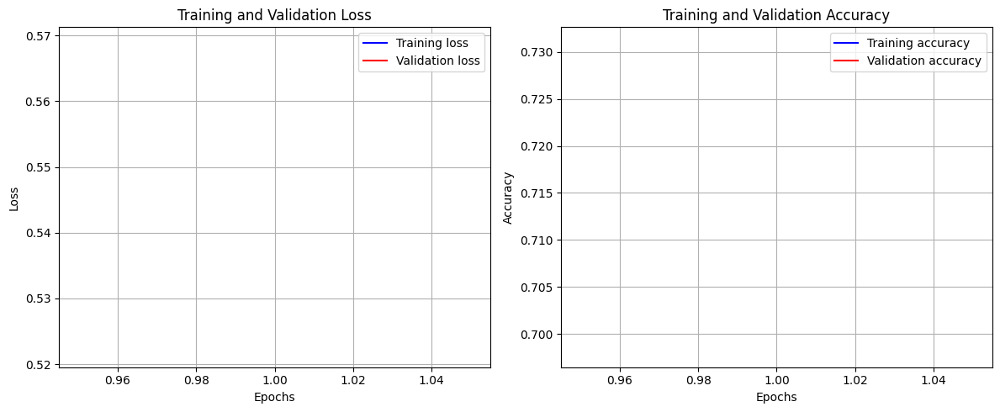

Validation Epoch: 100%|██████████| 63/63 [00:19<00:00,  3.17it/s]


Epoch 2/7 - Train Loss: 0.4318, Train Acc: 0.7998 - Val Loss: 0.5650, Val Acc: 0.7445


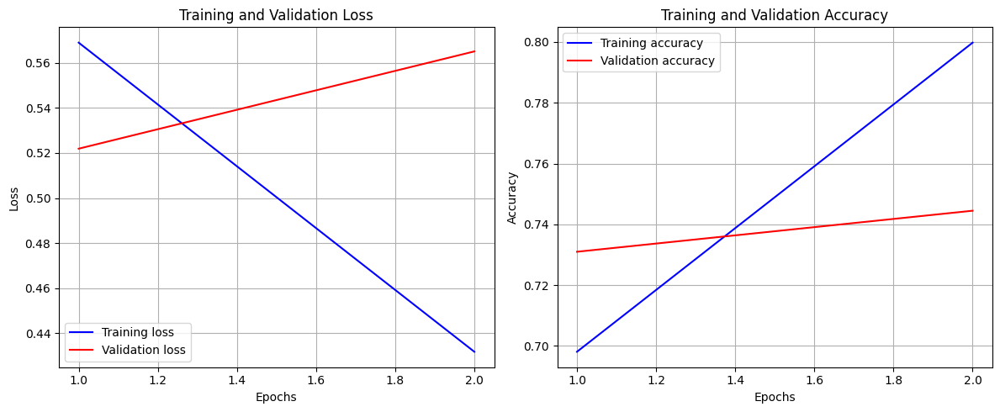

Validation Epoch: 100%|██████████| 63/63 [00:18<00:00,  3.35it/s]


Epoch 3/7 - Train Loss: 0.3608, Train Acc: 0.8374 - Val Loss: 0.4319, Val Acc: 0.7965


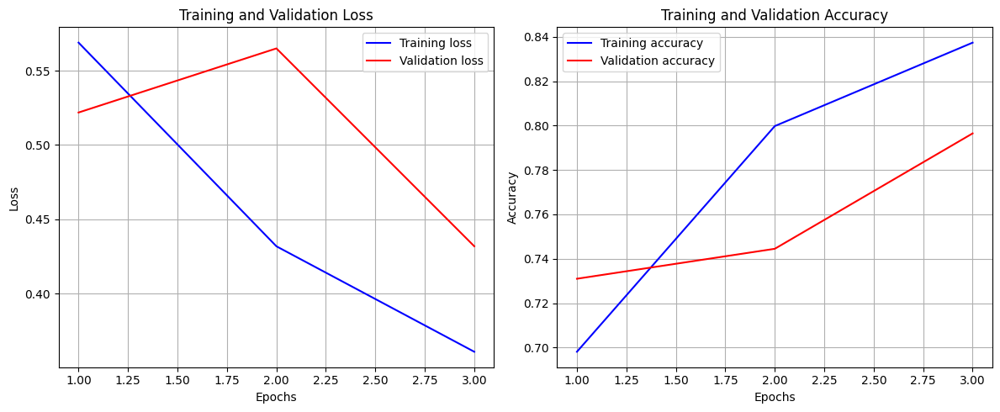

Validation Epoch: 100%|██████████| 63/63 [00:19<00:00,  3.23it/s]


Epoch 4/7 - Train Loss: 0.2884, Train Acc: 0.8713 - Val Loss: 0.4417, Val Acc: 0.8095


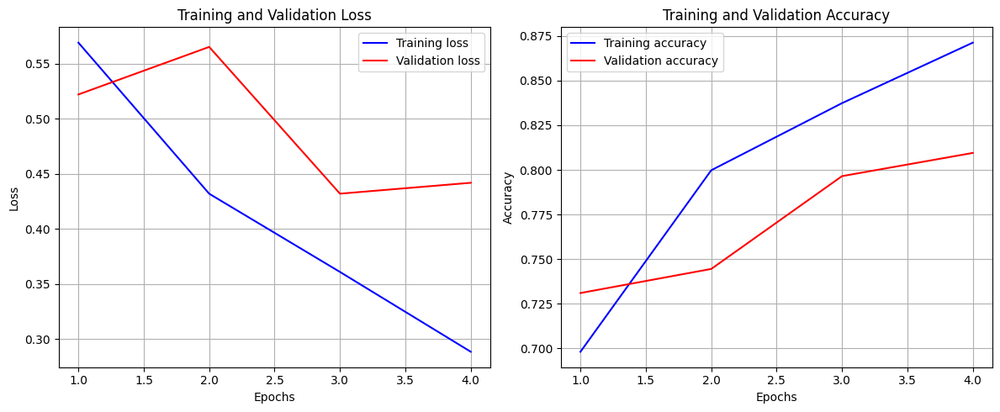

Validation Epoch: 100%|██████████| 63/63 [00:19<00:00,  3.26it/s]


Epoch 5/7 - Train Loss: 0.2386, Train Acc: 0.8972 - Val Loss: 0.4341, Val Acc: 0.8165


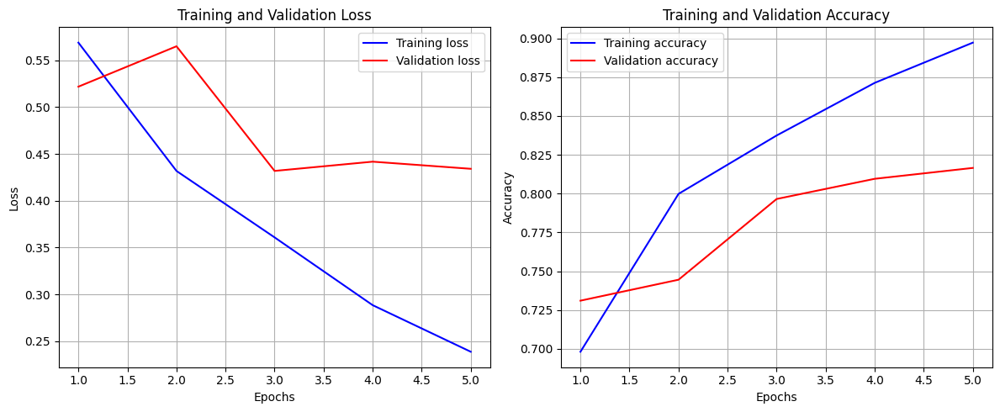

Validation Epoch: 100%|██████████| 63/63 [00:18<00:00,  3.33it/s]


Epoch 6/7 - Train Loss: 0.1799, Train Acc: 0.9246 - Val Loss: 0.4192, Val Acc: 0.8360


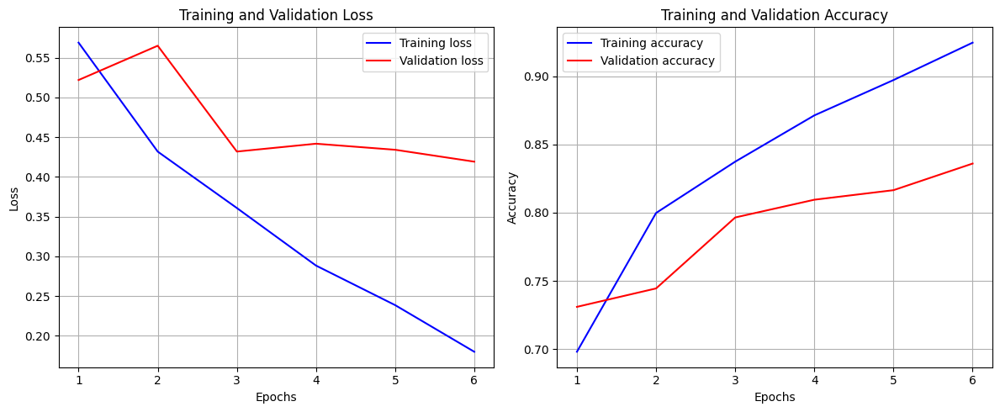

Validation Epoch: 100%|██████████| 63/63 [00:20<00:00,  3.12it/s]


Epoch 7/7 - Train Loss: 0.1376, Train Acc: 0.9440 - Val Loss: 0.4490, Val Acc: 0.8390


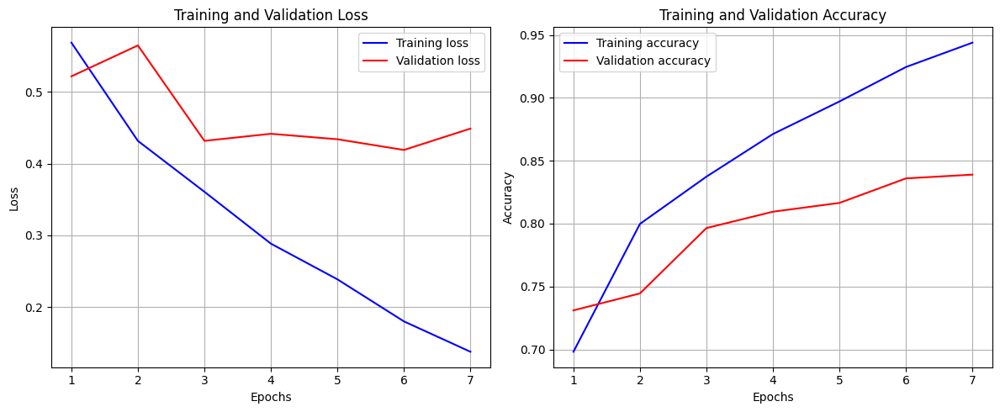

Training complete!
Model saved to my_trained_model.pth


In [36]:
# Запустите обучение
trainer.train(num_epochs=7)
trainer.save_model('my_trained_model.pth')

In [ ]:
loaded_model = my_model

In [38]:
import torch
import torch.nn.functional as F
from PIL import Image
from torchvision import transforms

# Define the same transformations used during training
transform_predict = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to a common size
    transforms.ToTensor(),         # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # Normalize pixel values
])

def predict_image(image_path: str, model: torch.nn.Module) -> str:
    """
    Predicts whether an image is 'Fake' or 'Real' using a trained model.

    Args:
        image_path (str): Path to the image file.
        model (torch.nn.Module): The loaded and trained PyTorch model.

    Returns:
        str: The predicted class label ('Fake' or 'Real').
    """
    # Load the image
    image = Image.open(image_path).convert('RGB')

    # Apply transformations
    image = transform_predict(image)

    # Add a batch dimension
    image = image.unsqueeze(0)

    # Move image to the correct device
    image = image.to(device)

    # Make prediction
    with torch.no_grad():
        outputs = model(image)
        probabilities = F.softmax(outputs, dim=1)
        print(f"Chance of Real = {probabilities[0][1]}")
        print(f"Chance of Fake = {probabilities[0][0]}")
        _, predicted_idx = torch.max(probabilities, 1)

    # Get class name (assuming class_names is defined globally or passed)
    # The class_names list should be consistent with how ImageFolder assigns labels
    # Example: ['Fake', 'Real'] where 0 corresponds to 'Fake' and 1 to 'Real'
    predicted_class = class_names[predicted_idx.item()]

    return predicted_class

print("Prediction function 'predict_image' defined successfully.")

Prediction function 'predict_image' defined successfully.


In [39]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("kshitizbhargava/deepfake-face-images")

print("Path to dataset files:", path)

100%|██████████| 244M/244M [00:02<00:00, 122MB/s]

Extracting files...


Path to dataset files: /root/.cache/kagglehub/datasets/kshitizbhargava/deepfake-face-images/versions/1


In [40]:
import torch
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import torch
import torch.nn as nn
import torch.optim as optim
from tqdm import tqdm # Для красивого отображения прогресса
import matplotlib.pyplot as plt # Для графиков
transform = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images to a common size
    transforms.ToTensor(),         # Convert images to PyTorch tensors
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]) # Normalize pixel values
])


In [43]:
path = '/root/.cache/kagglehub/datasets/kshitizbhargava/deepfake-face-images/versions/1/Final Dataset'

In [44]:
new_dataset = datasets.ImageFolder(path, transform=transform)
print(f"Successfully loaded {len(new_dataset)} images into the new dataset.")

Successfully loaded 12890 images into the new dataset.


In [45]:
indices = random.sample(range(len(new_dataset)), 1000)
small_dataset = Subset(new_dataset, indices)

['Fake', 'Real']


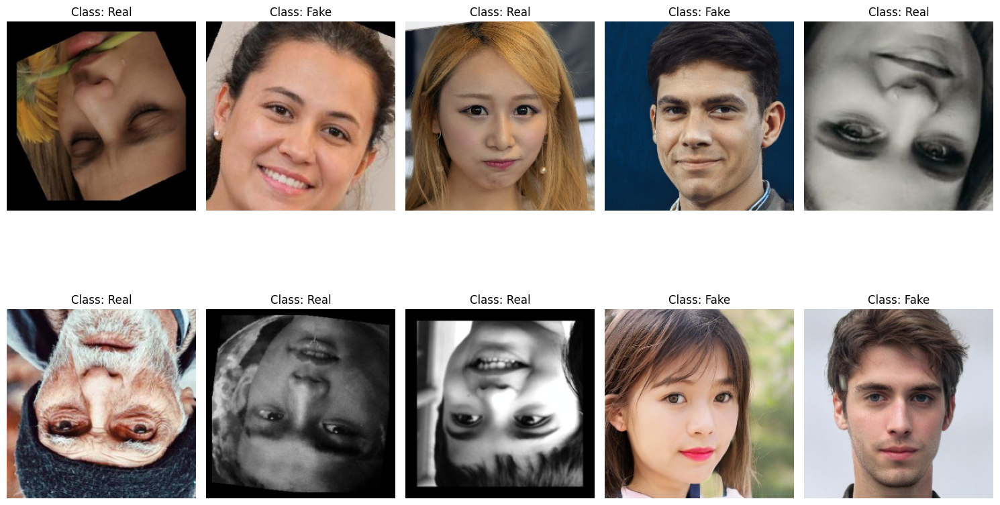

In [46]:
import random
import matplotlib.pyplot as plt
import numpy as np

# Get class names from the new evaluation dataset
class_names_new = new_dataset.classes
print(new_dataset.classes)

# Denormalization function (inverse of the normalization applied during transform)
def denormalize(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    # Transpose from C, H, W to H, W, C
    img_array = tensor.numpy().transpose((1, 2, 0))
    img_array = std * img_array + mean
    img_array = np.clip(img_array, 0, 1) # Clip to [0, 1] range
    return img_array

plt.figure(figsize=(15, 10))
for i in range(10):
    # Get a random index from the new small dataset
    idx = random.randint(0, len(small_dataset) - 1)
    image, label = small_dataset[idx]

    # Denormalize and convert to NumPy array for plotting
    img_to_show = denormalize(image)

    plt.subplot(2, 5, i + 1)
    plt.imshow(img_to_show)
    plt.title(f"Class: {class_names_new[label]}")
    plt.axis('off')

plt.tight_layout()
plt.show()

In [47]:
from torch.utils.data import DataLoader

# Create a DataLoader for the small_dataset
batch_size = 32 # Assuming batch_size is already defined
small_loader = DataLoader(small_dataset, batch_size=batch_size, shuffle=False)

print(f"Successfully loaded {len(small_dataset)} images into small_loader.")
print(f"Number of batches in small_loader: {len(small_loader)}")

Successfully loaded 1000 images into small_loader.
Number of batches in small_loader: 32


In [48]:
device = 'cpu'

In [49]:
import torch.nn.functional as F

def evaluate_model_on_new_dataset(model: torch.nn.Module, data_loader: torch.utils.data.DataLoader, criterion: torch.nn.Module, device: str):
    model.eval() # Set the model to evaluation mode
    running_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    # Assuming class_names_new is defined and 'Fake' is index 0, 'Real' is index 1
    fake_label_idx = 0
    real_label_idx = 1
    threshold = 0.4 # Default threshold

    with torch.no_grad(): # Disable gradient calculations
        for inputs, labels in tqdm(data_loader, desc="Evaluating on New Dataset"):
            inputs, labels = inputs.to(device), labels.to(device)

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            running_loss += loss.item() * inputs.size(0)

            probabilities = F.softmax(outputs, dim=1)
            # Apply custom prediction logic
            predicted_labels = (probabilities[:, fake_label_idx] >= threshold).long() # 0 if Fake, 1 if Real (based on threshold)

            total_samples += labels.size(0)
            correct_predictions += (predicted_labels == labels).sum().item()

    overall_loss = running_loss / total_samples
    overall_accuracy = correct_predictions / total_samples
    return overall_loss, overall_accuracy

In [50]:
criterion = nn.CrossEntropyLoss() # Use the same criterion as in training

print("\nStarting evaluation on the small_loader dataset...")
new_small_dataset_loss, new_small_dataset_accuracy = evaluate_model_on_new_dataset(loaded_model, small_loader, criterion, device)

print(f'Evaluation on small_loader Dataset - Loss: {new_small_dataset_loss:.4f}, Accuracy: {new_small_dataset_accuracy:.4f}')


Starting evaluation on the small_loader dataset...


Evaluating on New Dataset: 100%|██████████| 32/32 [00:09<00:00,  3.53it/s]

Evaluation on small_loader Dataset - Loss: 0.6915, Accuracy: 0.4480


Модель, обученная на датасете "https://www.kaggle.com/datasets/manjilkarki/deepfake-and-real-images", выдает 41% точность на датасете "https://www.kaggle.com/datasets/kshitizbhargava/deepfake-face-images". Bruh


['Fake', 'Real']


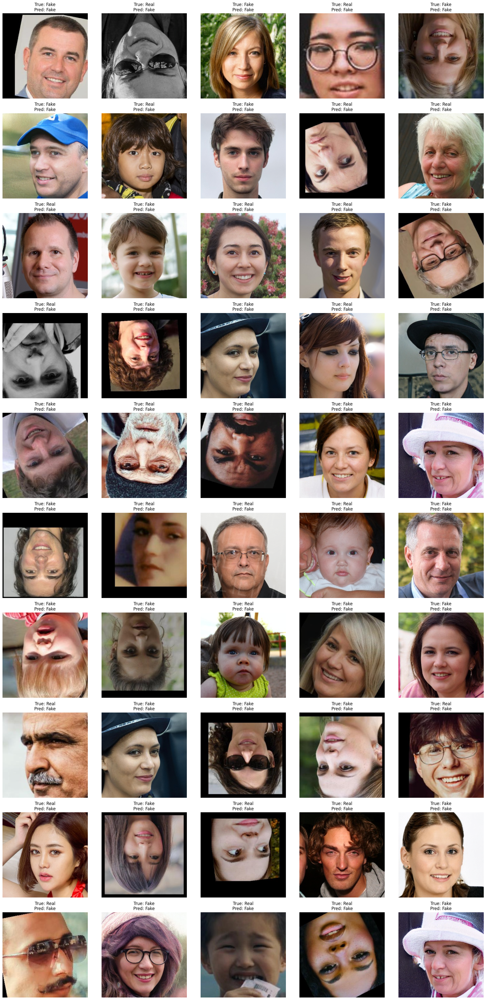

In [51]:
import random
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn.functional as F

# Ensure the model is in evaluation mode and on the correct device
loaded_model.eval()
loaded_model.to(device)

# Denormalization function (inverse of the normalization applied during transform)
def denormalize(tensor):
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    # Transpose from C, H, W to H, W, C
    img_array = tensor.numpy().transpose((1, 2, 0))
    img_array = std * img_array + mean
    img_array = np.clip(img_array, 0, 1) # Clip to [0, 1] range
    return img_array

plt.figure(figsize=(20, 40)) # Adjust figure size for 50 images
num_images_to_show = 50
print(class_names_new)
for i in range(num_images_to_show):
    # Get a random index from the new small dataset
    idx = random.randint(0, len(small_dataset) - 1)
    image_tensor, true_label_idx = small_dataset[idx]

    # Prepare image for model prediction
    image_input = image_tensor.unsqueeze(0).to(device) # Add batch dimension and move to device

    # Make prediction
    with torch.no_grad():
        outputs = loaded_model(image_input)
        probabilities = F.softmax(outputs, dim=1)
        _, predicted_idx = torch.max(probabilities, 1)

    # Get class names (assuming class_names_new is defined from new_eval_dataset)
    true_class = class_names_new[true_label_idx]
    predicted_class = class_names_new[predicted_idx.item()]

    # Denormalize and convert to NumPy array for plotting
    img_to_show = denormalize(image_tensor)

    plt.subplot(10, 5, i + 1) # 10 rows, 5 columns for 50 images
    plt.imshow(img_to_show)
    plt.title(f"True: {true_class}\nPred: {predicted_class}")
    plt.axis('off')

plt.tight_layout()
plt.show()
